# RFF Component Analysis

In [1]:
print("="*80)
print("IMPORTING UTILITIES")
print("="*80)

from src.Utils import *
from src.Executions import *
from src.Data import *
from src.Classifiers import *
from src.Plots import *
from src.Stat_tests import *

import os
import pandas as pd
import numpy as np
import multiprocessing
from joblib import Parallel, delayed


IMPORTING UTILITIES


In [5]:
print("="*80)
print("SETTING UP VARIABLES FOR TESTING")
print("="*80)

os.makedirs('img', exist_ok=True)
D_VALUES = np.logspace(np.log10(1), np.log10(1500), 10).astype(int)
DIFFICULTIES = ['easy', 'medium', 'hard']
SEEDS = [42, 123, 456, 789, 1024, 2048, 4096, 8192, 
         271828, 314159, 161803, 999, 5555, 7777,
         12345, 54321, 13579, 24680, 87654, 11111]
N_JOBS = max(1, multiprocessing.cpu_count() - 1)
sizes = [1000, 2000, 3000, 4000, 5000]

SETTING UP VARIABLES FOR TESTING


### Experiments with syntetic Datasets

EASY EXAMPLE PAIR PLOT


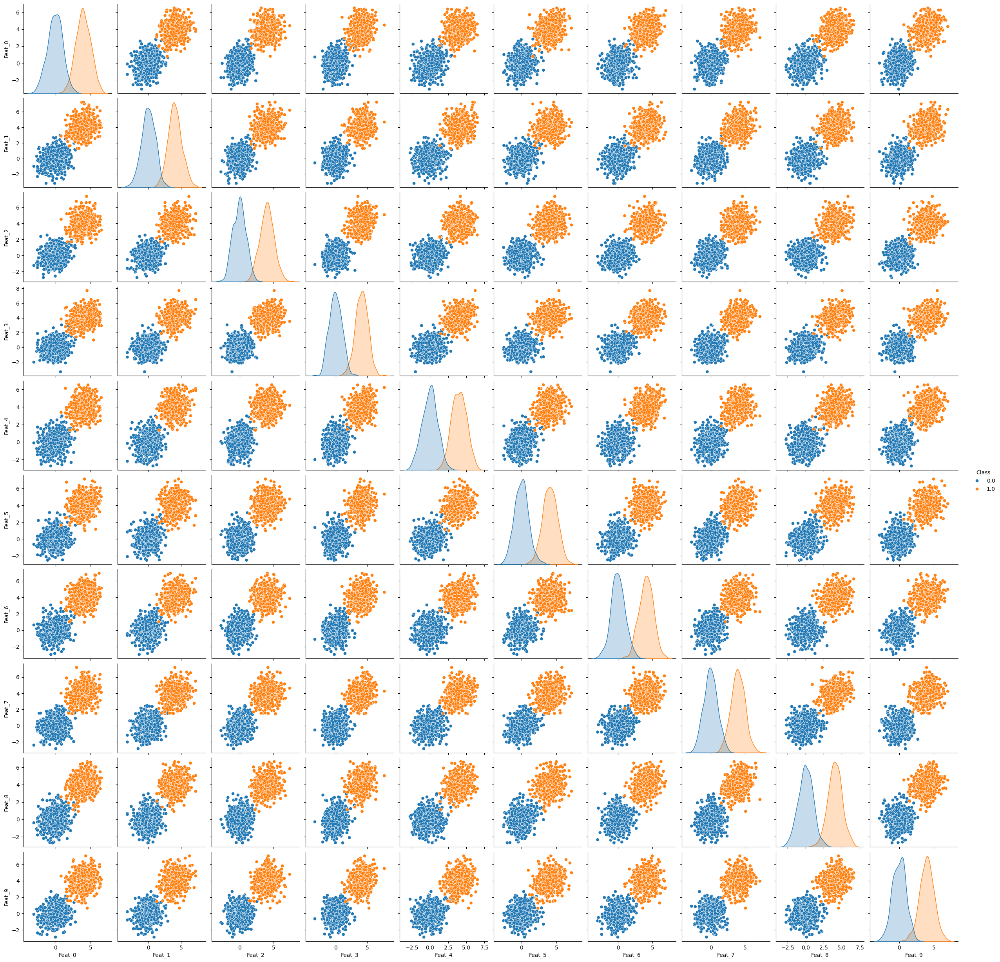

In [5]:
print("="*80)
print("EASY EXAMPLE PAIR PLOT")
print("="*80)

hardness_example('easy')

MEDIUM EXAMPLE PAIR PLOT


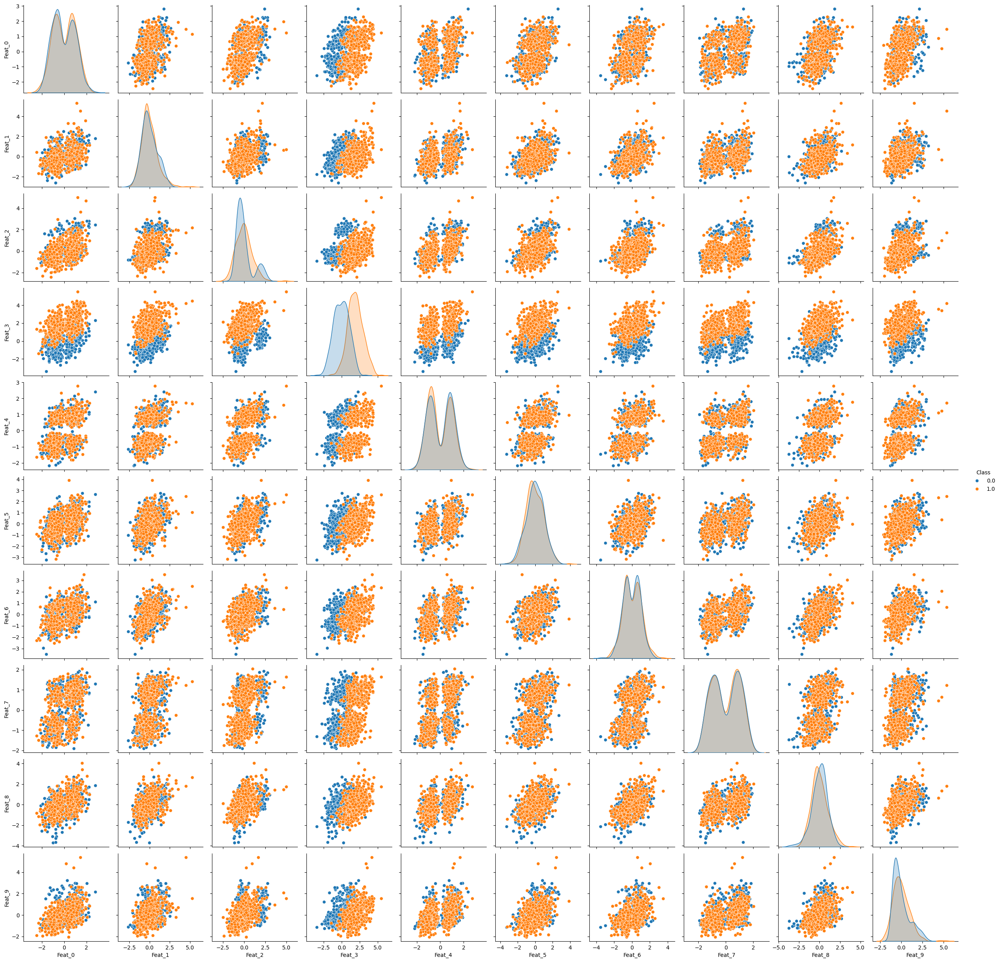

In [6]:
print("="*80)
print("MEDIUM EXAMPLE PAIR PLOT")
print("="*80)

hardness_example('medium')

HARD EXAMPLE PAIR PLOT


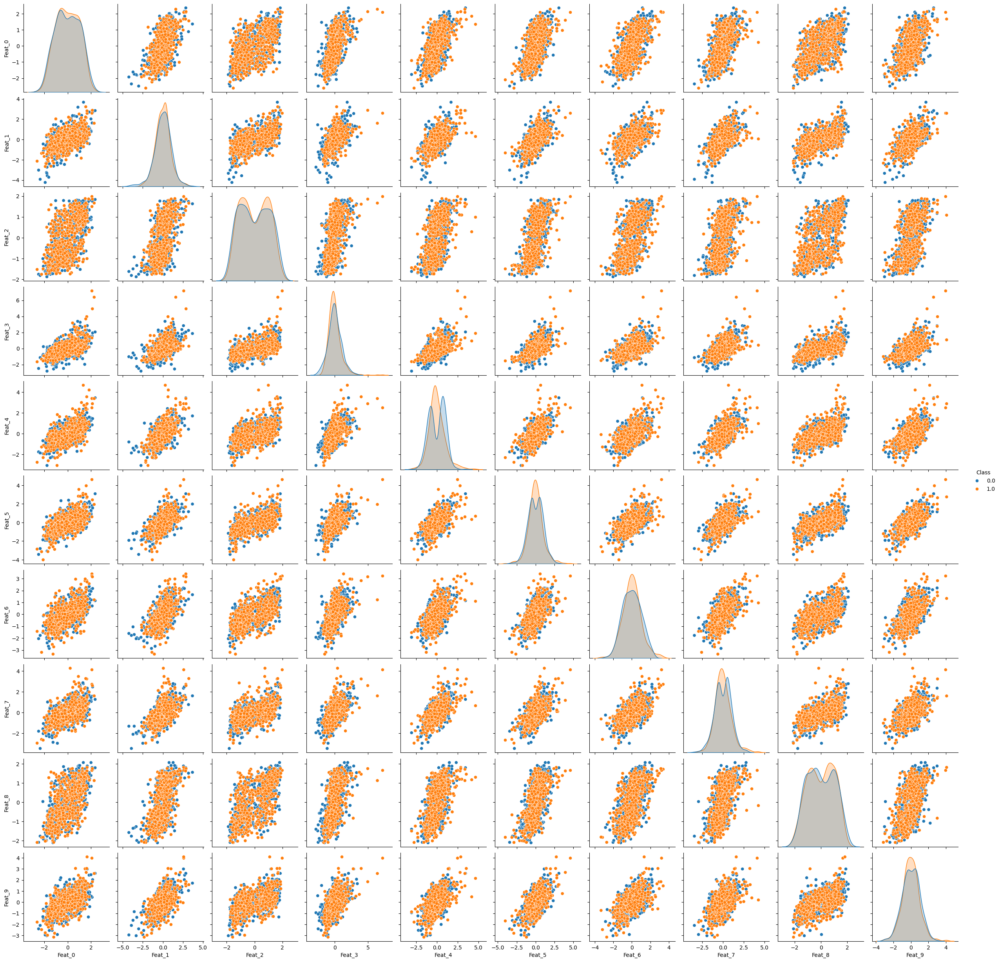

In [7]:
print("="*80)
print("HARD EXAMPLE PAIR PLOT")
print("="*80)

hardness_example('hard')

In [13]:
print("="*80)
print("TESTING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS")
print("="*80)
print(f"RFF Component Analysis: Testing {len(D_VALUES)} D values")
print(f"Difficulty levels: {len(DIFFICULTIES)}")
print(f"Different seeds: {len(SEEDS)}")
print(f"Total experiments: {len(DIFFICULTIES) * len(SEEDS)}")
print(f"Parallel workers: {N_JOBS}")
print(f"{'='*80}")

tasks = [(difficulty, seed, D_VALUES) 
         for difficulty in DIFFICULTIES 
         for seed in SEEDS
         for D_VALUE in D_VALUES]

print(f"\nProcessing {len(tasks)} total tasks in parallel:\n")

results_nested = Parallel(n_jobs=N_JOBS, verbose=10)(
    delayed(process_single_run)(difficulty, seed, D_VALUE) for difficulty, seed, D_VALUE in tasks
)

results = [item for sublist in results_nested for item in sublist]

print("\nBenchmark complete")


TESTING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS
RFF Component Analysis: Testing 10 D values
Difficulty levels: 3
Different seeds: 20
Total experiments: 60
Parallel workers: 7

Processing 600 total tasks in parallel:



[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done   4 tasks      | elapsed:    5.0s
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:   10.2s
[Parallel(n_jobs=7)]: Done  18 tasks      | elapsed:   15.5s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:   20.3s
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:   29.2s
[Parallel(n_jobs=7)]: Done  47 tasks      | elapsed:   34.3s
[Parallel(n_jobs=7)]: Done  58 tasks      | elapsed:   43.8s
[Parallel(n_jobs=7)]: Done  71 tasks      | elapsed:   53.1s
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:   59.0s
[Parallel(n_jobs=7)]: Done  99 tasks      | elapsed:  1.2min
[Parallel(n_jobs=7)]: Done 114 tasks      | elapsed:  1.4min
[Parallel(n_jobs=7)]: Done 131 tasks      | elapsed:  1.6min
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:  1.8min
[Parallel(n_jobs=7)]: Done 167 tasks      | elapsed:  2.0min
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:  2.3min
[Parallel(


Benchmark complete


[Parallel(n_jobs=7)]: Done 600 out of 600 | elapsed:  9.4min finished


VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS

Analysis for EASY Difficulty
Saved plot to img/rff_comparative_analysis_easy.png

Analysis for MEDIUM Difficulty
Saved plot to img/rff_comparative_analysis_medium.png

Analysis for HARD Difficulty
Saved plot to img/rff_comparative_analysis_hard.png


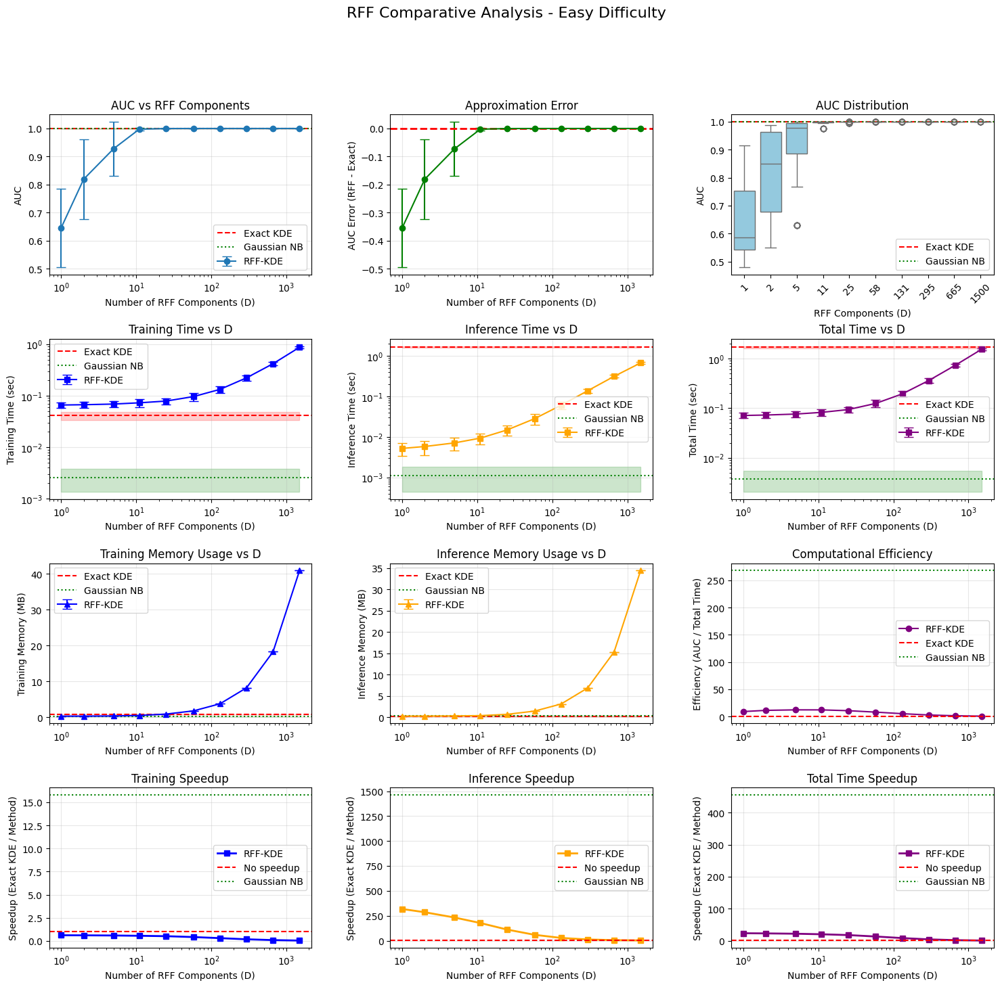

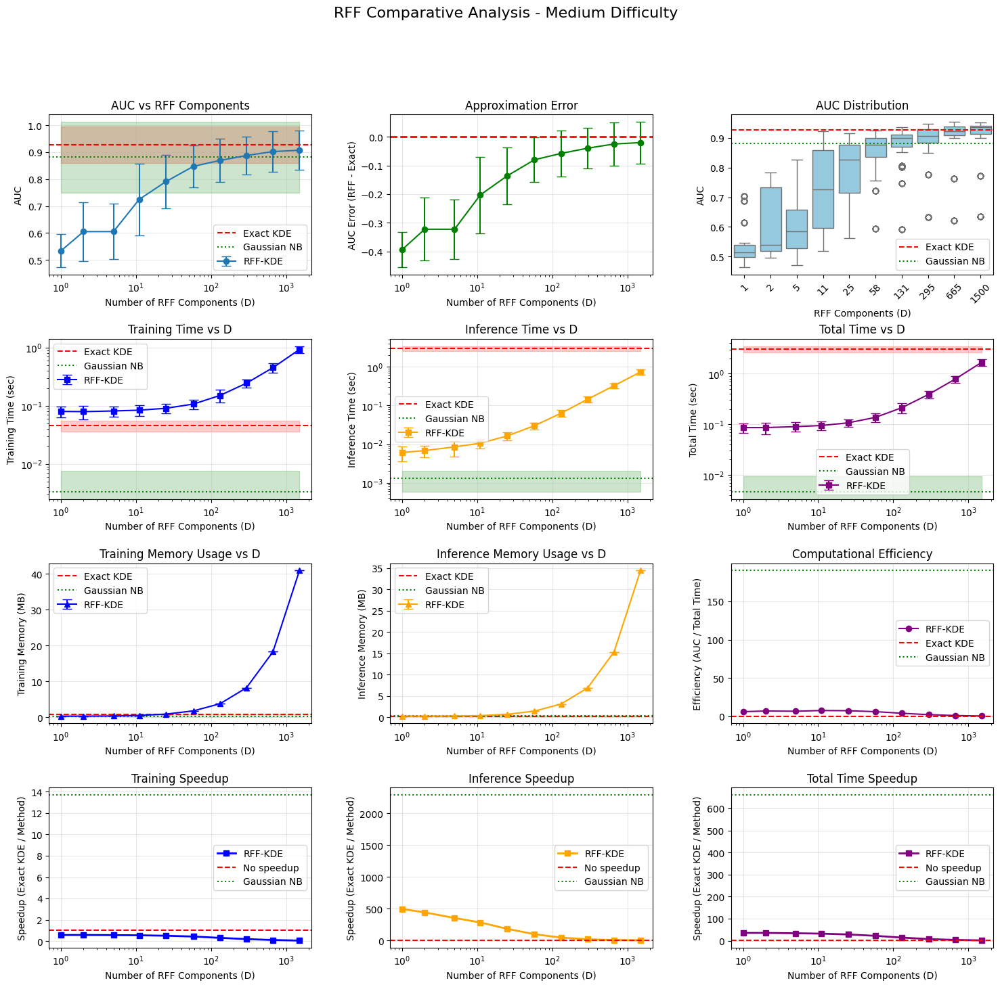

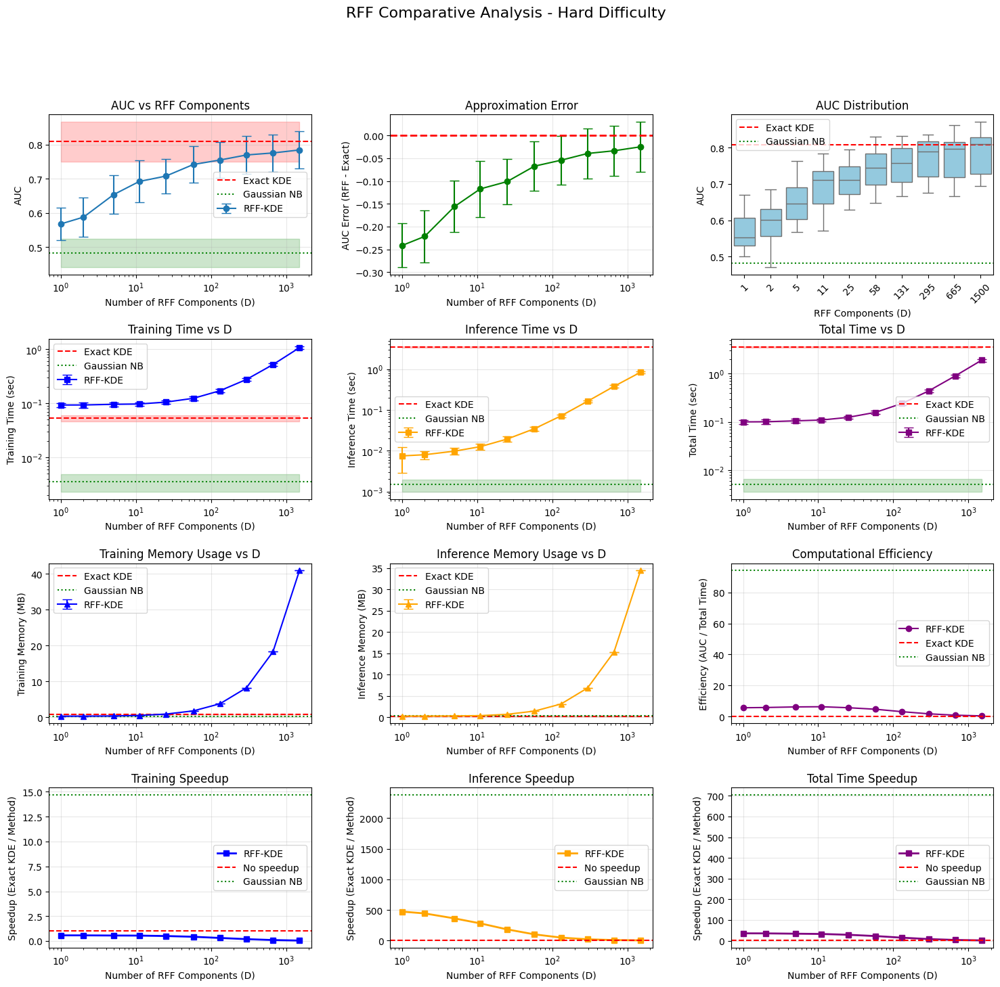

In [14]:
print("="*80)
print("VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS")
print("="*80)

df = pd.DataFrame(results)
plot_rff_comparative_analysis(df, D_VALUES, DIFFICULTIES)

### Test on real data

In [2]:
print("="*80)
print("IMPORTING AND PREPARING THE REAL DATASET")
print("="*80)
X, y = magic_gamma_data()
X, y = prepare_magic_gamma(X,y)
D_VALUES_REAL = np.logspace(np.log10(1), np.log10(len(X)//2), 10).astype(int)

IMPORTING AND PREPARING THE REAL DATASET


In [3]:
print(D_VALUES_REAL)

[   1    2    7   21   58  162  448 1242 3436 9509]


VISUALIZING THE REAL DATASET PAIR PLOT


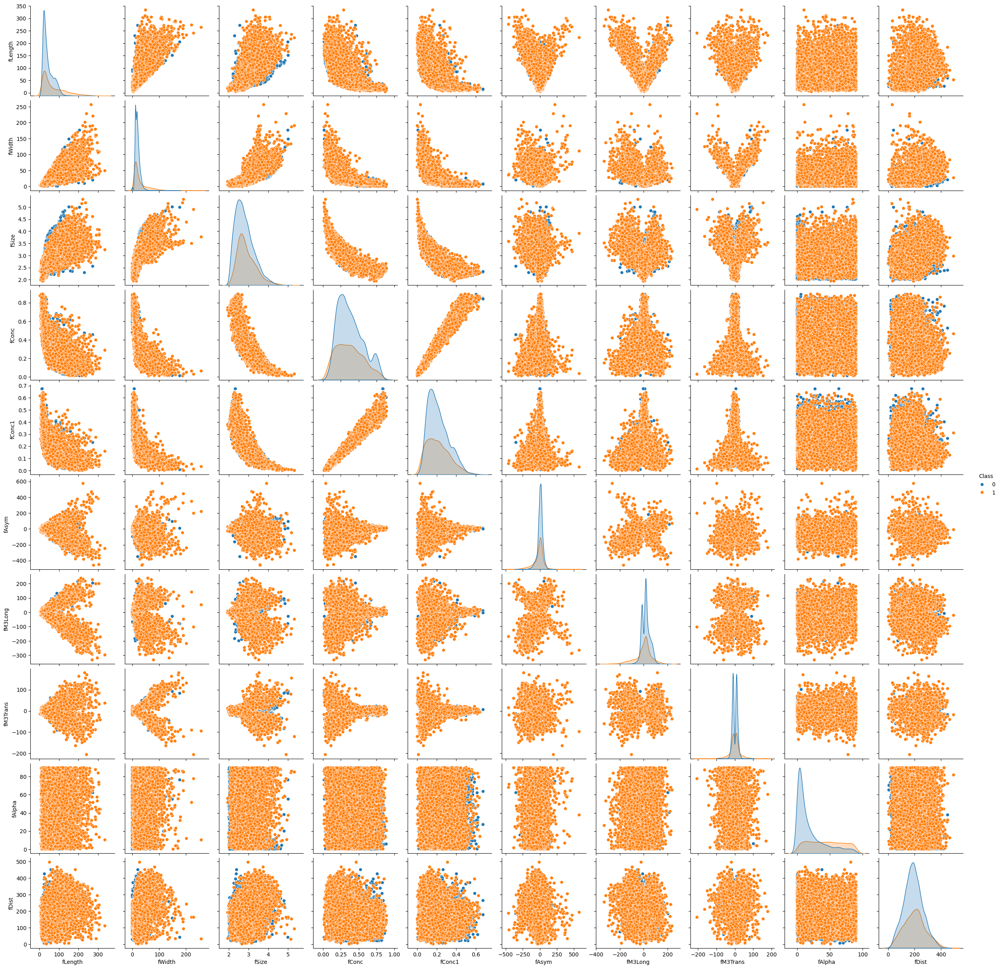

In [5]:
print("="*80)
print("VISUALIZING THE REAL DATASET PAIR PLOT")
print("="*80)
visualize_distribution(X, y)

VISUALIZING THE REAL DATASET FEATURE-TARGET CORRELATION


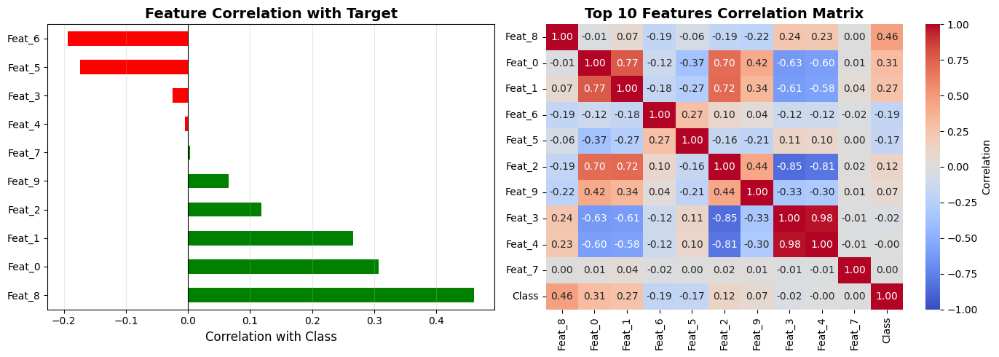


Feature-Target Correlation:
Feat_8    0.460979
Feat_0    0.307572
Feat_1    0.265596
Feat_2    0.117795
Feat_9    0.065203
Feat_7    0.003837
Feat_4   -0.004797
Feat_3   -0.024615
Feat_5   -0.173587
Feat_6   -0.193409
Name: Class, dtype: float64


In [5]:
print("="*80)
print("VISUALIZING THE REAL DATASET FEATURE-TARGET CORRELATION")
print("="*80)
plot_feature_target_correlation(X, y)

In [6]:
print("="*80)
print("TESTING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS ON MAGIC GAMMA DATASET")
print("="*80)
print(f"Dataset size: {X.shape[0]} samples, {X.shape[1]} features")
print(f"RFF Component Analysis: Testing {len(D_VALUES_REAL)} D values")
print(f"Different seeds: {len(SEEDS)}")
print(f"Total experiments: {len(SEEDS) * len(D_VALUES_REAL)} (RFF) + {2 * len(SEEDS)} (baselines)")
print(f"Parallel workers: {N_JOBS}")
print(f"{'='*80}")

# Crea task: aggiungi flag per calcolare baseline solo al primo D di ogni seed
tasks_magic = []
for seed in SEEDS:
    for i, D_VALUE in enumerate(D_VALUES_REAL):
        compute_baselines = (i == 0)  # True solo per il primo D di ogni seed
        tasks_magic.append((seed, D_VALUE, compute_baselines))

print(f"\nProcessing {len(tasks_magic)} total tasks in parallel:\n")

results_nested_magic = Parallel(n_jobs=N_JOBS, verbose=10)(
    delayed(process_single_run_real)(X, y, seed, D_VALUE, compute_baselines) 
    for seed, D_VALUE, compute_baselines in tasks_magic
)

results_magic = [item for sublist in results_nested_magic for item in sublist]
print("\n✅ Benchmark complete")

TESTING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS ON MAGIC GAMMA DATASET
Dataset size: 19020 samples, 10 features
RFF Component Analysis: Testing 10 D values
Different seeds: 20
Total experiments: 200 (RFF) + 40 (baselines)
Parallel workers: 7

Processing 200 total tasks in parallel:



[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done   4 tasks      | elapsed:    4.5s
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:    6.8s
[Parallel(n_jobs=7)]: Done  18 tasks      | elapsed:   20.5s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:   43.1s
/Users/federicoclerici/.pyenv/versions/3.12.2/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:   51.8s
[Parallel(n_jobs=7)]: Done  47 tasks      | elapsed:  1.3min
[Parallel(n_jobs=7)]: Done  58 tasks      | elapsed:  1.7min
[Parallel(n_jobs=7)]: Done  71 tasks      | elapsed:  1.9min
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:  2.4min
[Parallel(n_jobs=7)]: Done  99 tasks      | elapsed:  2.9min
[Parallel(n_jobs=7)]: Done 114 t


✅ Benchmark complete


[Parallel(n_jobs=7)]: Done 200 out of 200 | elapsed:  6.6min finished


In [7]:
def plot_rff_comparative_analysis_magic(df_magic, D_VALUES_MAGIC):
    
    # 2. Extract data by method
    df_kde = df_magic[df_magic['Method'] == 'Exact_KDE'].copy()
    df_gnb = df_magic[df_magic['Method'] == 'Gaussian_NB'].copy()
    df_rff = df_magic[(df_magic['Method'] == 'RFF_KDE') & (df_magic['D'] > 0)].copy()

    # 3. Check data availability
    has_kde = not df_kde.empty
    has_gnb = not df_gnb.empty
    
    if not has_kde:
        print("⚠️  WARNING: No Exact_KDE data found. Baseline will not be plotted.")
    if not has_gnb:
        print("⚠️  WARNING: No Gaussian_NB data found. Baseline will not be plotted.")
    if df_rff.empty:
        print("❌ ERROR: No RFF_KDE data found. Cannot plot.")
        return
    
    # Get unique D values
    D_VALUES_MAGIC = sorted(df_rff['D'].unique())
    
    # Create figure
    fig = plt.figure(figsize=(18, 16))
    gs = fig.add_gridspec(4, 3, hspace=0.4, wspace=0.3)

    # =================================================================
    # Row 1: AUC Analysis
    # =================================================================
    
    # 1.1: AUC vs D
    ax1 = fig.add_subplot(gs[0, 0])
    rff_auc_mean = df_rff.groupby('D')['AUC'].mean()
    rff_auc_std = df_rff.groupby('D')['AUC'].std()
    ax1.errorbar(rff_auc_mean.index, rff_auc_mean.values, yerr=rff_auc_std.values, 
                marker='o', capsize=5, label='RFF-KDE')
    
    if has_kde:
        kde_auc_mean = df_kde['AUC'].mean()
        kde_auc_std = df_kde['AUC'].std()
        ax1.axhline(kde_auc_mean, color='red', linestyle='--', label='Exact KDE')
        ax1.fill_between(D_VALUES_MAGIC, 
                        kde_auc_mean - kde_auc_std,
                        kde_auc_mean + kde_auc_std,
                        color='red', alpha=0.2)
    
    if has_gnb:
        gnb_auc_mean = df_gnb['AUC'].mean()
        gnb_auc_std = df_gnb['AUC'].std()
        ax1.axhline(gnb_auc_mean, color='green', linestyle=':', label='Gaussian NB')
        ax1.fill_between(D_VALUES_MAGIC, 
                        gnb_auc_mean - gnb_auc_std,
                        gnb_auc_mean + gnb_auc_std,
                        color='green', alpha=0.2)
    
    ax1.set_xlabel('Number of RFF Components (D)')
    ax1.set_ylabel('AUC')
    ax1.set_title('AUC vs RFF Components')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    ax1.set_xscale('log')

    # 1.2: AUC Error
    ax2 = fig.add_subplot(gs[0, 1])
    if has_kde:
        exact_auc_mean = df_kde['AUC'].mean()
        auc_error = df_rff.groupby('D')['AUC'].mean() - exact_auc_mean
        auc_error_std = df_rff.groupby('D')['AUC'].std()
        ax2.errorbar(auc_error.index, auc_error.values, yerr=auc_error_std.values,
                    marker='o', capsize=5, color='green')
        ax2.axhline(0, color='red', linestyle='--', linewidth=2, label='Exact KDE baseline')
        ax2.set_ylabel('AUC Error (RFF - Exact)')
        ax2.set_title('Approximation Error')
    else:
        ax2.text(0.5, 0.5, 'No baseline data available', 
                ha='center', va='center', transform=ax2.transAxes, fontsize=14)
        ax2.set_title('Approximation Error (N/A)')
    
    ax2.set_xlabel('Number of RFF Components (D)')
    ax2.grid(True, alpha=0.3)
    if has_kde:
        ax2.set_xscale('log')
    ax2.legend()

    # 1.3: AUC Boxplot
    ax3 = fig.add_subplot(gs[0, 2])
    df_rff_copy = df_rff.copy()
    df_rff_copy['D_str'] = df_rff_copy['D'].astype(str)
    sns.boxplot(data=df_rff_copy, x='D_str', y='AUC', ax=ax3, color='skyblue')
    
    if has_kde:
        ax3.axhline(df_kde['AUC'].mean(), color='red', linestyle='--', label='Exact KDE')
    if has_gnb:
        ax3.axhline(df_gnb['AUC'].mean(), color='green', linestyle=':', label='Gaussian NB')
    
    ax3.set_xlabel('RFF Components (D)')
    ax3.set_ylabel('AUC')
    ax3.set_title('AUC Distribution')
    ax3.legend()
    ax3.tick_params(axis='x', rotation=45)

    # =================================================================
    # Row 2: Time Analysis (LOG SCALE - SAFE)
    # =================================================================

    # 2.1: Training Time
    ax4 = fig.add_subplot(gs[1, 0])
    train_mean = df_rff.groupby('D')['Train_Time_sec'].mean()
    train_std = df_rff.groupby('D')['Train_Time_sec'].std()
    ax4.errorbar(train_mean.index, train_mean.values, yerr=train_std.values,
                marker='s', capsize=5, label='RFF-KDE', color='blue')
    
    if has_kde:
        kde_train_mean = df_kde['Train_Time_sec'].mean()
        kde_train_std = df_kde['Train_Time_sec'].std()
        ax4.axhline(kde_train_mean, color='red', linestyle='--', label='Exact KDE')
        lower_train_kde = max(kde_train_mean - kde_train_std, 0)
        ax4.fill_between(D_VALUES_MAGIC, lower_train_kde, 
                        kde_train_mean + kde_train_std, color='red', alpha=0.2)
    
    if has_gnb:
        gnb_train_mean = df_gnb['Train_Time_sec'].mean()
        gnb_train_std = df_gnb['Train_Time_sec'].std()
        ax4.axhline(gnb_train_mean, color='green', linestyle=':', label='Gaussian NB')
        lower_train_gnb = max(gnb_train_mean - gnb_train_std, 0)
        ax4.fill_between(D_VALUES_MAGIC, lower_train_gnb, 
                        gnb_train_mean + gnb_train_std, color='green', alpha=0.2)
    
    ax4.set_xlabel('Number of RFF Components (D)')
    ax4.set_ylabel('Training Time (sec)')
    ax4.set_title('Training Time vs D')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    ax4.set_xscale('log')
    ax4.set_yscale('log')

    # 2.2: Inference Time
    ax5 = fig.add_subplot(gs[1, 1])
    infer_mean = df_rff.groupby('D')['Infer_Time_sec'].mean()
    infer_std = df_rff.groupby('D')['Infer_Time_sec'].std()
    ax5.errorbar(infer_mean.index, infer_mean.values, yerr=infer_std.values,
                marker='s', capsize=5, label='RFF-KDE', color='orange')
    
    if has_kde:
        kde_infer_mean = df_kde['Infer_Time_sec'].mean()
        kde_infer_std = df_kde['Infer_Time_sec'].std()
        ax5.axhline(kde_infer_mean, color='red', linestyle='--', label='Exact KDE')
        lower_infer_kde = max(kde_infer_mean - kde_infer_std, 0)
        ax5.fill_between(D_VALUES_MAGIC, lower_infer_kde, 
                        kde_infer_mean + kde_infer_std, color='red', alpha=0.2)
    
    if has_gnb:
        gnb_infer_mean = df_gnb['Infer_Time_sec'].mean()
        gnb_infer_std = df_gnb['Infer_Time_sec'].std()
        ax5.axhline(gnb_infer_mean, color='green', linestyle=':', label='Gaussian NB')
        lower_infer_gnb = max(gnb_infer_mean - gnb_infer_std, 0)
        ax5.fill_between(D_VALUES_MAGIC, lower_infer_gnb, 
                        gnb_infer_mean + gnb_infer_std, color='green', alpha=0.2)
    
    ax5.set_xlabel('Number of RFF Components (D)')
    ax5.set_ylabel('Inference Time (sec)')
    ax5.set_title('Inference Time vs D')
    ax5.legend()
    ax5.grid(True, alpha=0.3)
    ax5.set_xscale('log')
    ax5.set_yscale('log')

    # 2.3: Total Time
    ax6 = fig.add_subplot(gs[1, 2])
    total_mean = df_rff.groupby('D')['Total_Time_sec'].mean()
    total_std = df_rff.groupby('D')['Total_Time_sec'].std()
    ax6.errorbar(total_mean.index, total_mean.values, yerr=total_std.values,
                marker='s', capsize=5, label='RFF-KDE', color='purple')
    
    if has_kde:
        kde_total_mean = df_kde['Total_Time_sec'].mean()
        kde_total_std = df_kde['Total_Time_sec'].std()
        ax6.axhline(kde_total_mean, color='red', linestyle='--', label='Exact KDE')
        lower_total_kde = max(kde_total_mean - kde_total_std, 0)
        ax6.fill_between(D_VALUES_MAGIC, lower_total_kde, 
                        kde_total_mean + kde_total_std, color='red', alpha=0.2)
    
    if has_gnb:
        gnb_total_mean = df_gnb['Total_Time_sec'].mean()
        gnb_total_std = df_gnb['Total_Time_sec'].std()
        ax6.axhline(gnb_total_mean, color='green', linestyle=':', label='Gaussian NB')
        lower_total_gnb = max(gnb_total_mean - gnb_total_std, 0)
        ax6.fill_between(D_VALUES_MAGIC, lower_total_gnb, 
                        gnb_total_mean + gnb_total_std, color='green', alpha=0.2)
    
    ax6.set_xlabel('Number of RFF Components (D)')
    ax6.set_ylabel('Total Time (sec)')
    ax6.set_title('Total Time vs D')
    ax6.legend()
    ax6.grid(True, alpha=0.3)
    ax6.set_xscale('log')
    ax6.set_yscale('log')

    # =================================================================
    # Row 3: Memory & Efficiency
    # =================================================================

    # 3.1: Training Memory
    ax7 = fig.add_subplot(gs[2, 0])
    train_mem_mean = df_rff.groupby('D')['Train_Memory_MB'].mean()
    train_mem_std = df_rff.groupby('D')['Train_Memory_MB'].std()
    ax7.errorbar(train_mem_mean.index, train_mem_mean.values, yerr=train_mem_std.values,
                marker='^', capsize=5, label='RFF-KDE', color='blue')
    
    if has_kde:
        kde_mem_mean = df_kde['Train_Memory_MB'].mean()
        kde_mem_std = df_kde['Train_Memory_MB'].std()
        ax7.axhline(kde_mem_mean, color='red', linestyle='--', label='Exact KDE')
        ax7.fill_between(D_VALUES_MAGIC, kde_mem_mean - kde_mem_std,
                        kde_mem_mean + kde_mem_std, color='red', alpha=0.2)
    
    if has_gnb:
        gnb_mem_mean = df_gnb['Train_Memory_MB'].mean()
        gnb_mem_std = df_gnb['Train_Memory_MB'].std()
        ax7.axhline(gnb_mem_mean, color='green', linestyle=':', label='Gaussian NB')
        ax7.fill_between(D_VALUES_MAGIC, gnb_mem_mean - gnb_mem_std,
                        gnb_mem_mean + gnb_mem_std, color='green', alpha=0.2)
    
    ax7.set_xlabel('Number of RFF Components (D)')
    ax7.set_ylabel('Training Memory (MB)')
    ax7.set_title('Training Memory Usage vs D')
    ax7.legend()
    ax7.grid(True, alpha=0.3)
    ax7.set_xscale('log')

    # 3.2: Inference Memory
    ax8 = fig.add_subplot(gs[2, 1])
    infer_mem_mean = df_rff.groupby('D')['Infer_Memory_MB'].mean()
    infer_mem_std = df_rff.groupby('D')['Infer_Memory_MB'].std()
    ax8.errorbar(infer_mem_mean.index, infer_mem_mean.values, yerr=infer_mem_std.values,
                marker='^', capsize=5, label='RFF-KDE', color='orange')
    
    if has_kde:
        kde_imem_mean = df_kde['Infer_Memory_MB'].mean()
        kde_imem_std = df_kde['Infer_Memory_MB'].std()
        ax8.axhline(kde_imem_mean, color='red', linestyle='--', label='Exact KDE')
        ax8.fill_between(D_VALUES_MAGIC, kde_imem_mean - kde_imem_std,
                        kde_imem_mean + kde_imem_std, color='red', alpha=0.2)
    
    if has_gnb:
        gnb_imem_mean = df_gnb['Infer_Memory_MB'].mean()
        gnb_imem_std = df_gnb['Infer_Memory_MB'].std()
        ax8.axhline(gnb_imem_mean, color='green', linestyle=':', label='Gaussian NB')
        ax8.fill_between(D_VALUES_MAGIC, gnb_imem_mean - gnb_imem_std,
                        gnb_imem_mean + gnb_imem_std, color='green', alpha=0.2)
    
    ax8.set_xlabel('Number of RFF Components (D)')
    ax8.set_ylabel('Inference Memory (MB)')
    ax8.set_title('Inference Memory Usage vs D')
    ax8.legend()
    ax8.grid(True, alpha=0.3)
    ax8.set_xscale('log')

    # 3.3: Efficiency
    ax9 = fig.add_subplot(gs[2, 2])
    rff_auc_mean_vals = df_rff.groupby('D')['AUC'].mean()
    rff_total_mean_vals = df_rff.groupby('D')['Total_Time_sec'].mean()
    rff_auc_eff = rff_auc_mean_vals / rff_total_mean_vals
    
    ax9.plot(rff_auc_eff.index, rff_auc_eff.values, marker='o', label='RFF-KDE', color='purple')
    
    if has_kde:
        kde_auc_eff = df_kde['AUC'].mean() / df_kde['Total_Time_sec'].mean()
        ax9.axhline(kde_auc_eff, color='red', linestyle='--', label='Exact KDE')
    
    if has_gnb:
        gnb_auc_eff = df_gnb['AUC'].mean() / df_gnb['Total_Time_sec'].mean()
        ax9.axhline(gnb_auc_eff, color='green', linestyle=':', label='Gaussian NB')
    
    ax9.set_xlabel('Number of RFF Components (D)')
    ax9.set_ylabel('Efficiency (AUC / Total Time)')
    ax9.set_title('Computational Efficiency')
    ax9.legend()
    ax9.grid(True, alpha=0.3)
    ax9.set_xscale('log')

    # =================================================================
    # Row 4: Speedup Analysis
    # =================================================================

    # 4.1: Training Speedup
    ax10 = fig.add_subplot(gs[3, 0])
    if has_kde:
        kde_train_mean = df_kde['Train_Time_sec'].mean()
        rff_train_mean = df_rff.groupby('D')['Train_Time_sec'].mean()
        train_speedup_rff = kde_train_mean / rff_train_mean
        ax10.plot(train_speedup_rff.index, train_speedup_rff.values, 
                 marker='s', linewidth=2, color='blue', label='RFF-KDE')
        ax10.axhline(1.0, color='red', linestyle='--', label='No speedup')
        
        if has_gnb:
            gnb_train_mean = df_gnb['Train_Time_sec'].mean()
            train_speedup_gnb = kde_train_mean / gnb_train_mean
            ax10.axhline(train_speedup_gnb, color='green', linestyle=':', label='Gaussian NB')
    else:
        ax10.text(0.5, 0.5, 'No baseline data available', 
                 ha='center', va='center', transform=ax10.transAxes, fontsize=14)
    
    ax10.set_xlabel('Number of RFF Components (D)')
    ax10.set_ylabel('Speedup (Exact KDE / Method)')
    ax10.set_title('Training Speedup')
    ax10.legend()
    ax10.grid(True, alpha=0.3)
    if has_kde:
        ax10.set_xscale('log')

    # 4.2: Inference Speedup
    ax11 = fig.add_subplot(gs[3, 1])
    if has_kde:
        kde_infer_mean = df_kde['Infer_Time_sec'].mean()
        rff_infer_mean = df_rff.groupby('D')['Infer_Time_sec'].mean()
        infer_speedup_rff = kde_infer_mean / rff_infer_mean
        ax11.plot(infer_speedup_rff.index, infer_speedup_rff.values, 
                 marker='s', linewidth=2, color='orange', label='RFF-KDE')
        ax11.axhline(1.0, color='red', linestyle='--', label='No speedup')
        
        if has_gnb:
            gnb_infer_mean = df_gnb['Infer_Time_sec'].mean()
            infer_speedup_gnb = kde_infer_mean / gnb_infer_mean
            ax11.axhline(infer_speedup_gnb, color='green', linestyle=':', label='Gaussian NB')
    else:
        ax11.text(0.5, 0.5, 'No baseline data available', 
                 ha='center', va='center', transform=ax11.transAxes, fontsize=14)
    
    ax11.set_xlabel('Number of RFF Components (D)')
    ax11.set_ylabel('Speedup (Exact KDE / Method)')
    ax11.set_title('Inference Speedup')
    ax11.legend()
    ax11.grid(True, alpha=0.3)
    if has_kde:
        ax11.set_xscale('log')

    # 4.3: Total Time Speedup
    ax12 = fig.add_subplot(gs[3, 2])
    if has_kde:
        kde_total_mean = df_kde['Total_Time_sec'].mean()
        rff_total_mean = df_rff.groupby('D')['Total_Time_sec'].mean()
        total_speedup_rff = kde_total_mean / rff_total_mean
        ax12.plot(total_speedup_rff.index, total_speedup_rff.values, 
                 marker='s', linewidth=2, color='purple', label='RFF-KDE')
        ax12.axhline(1.0, color='red', linestyle='--', label='No speedup')
        
        if has_gnb:
            gnb_total_mean = df_gnb['Total_Time_sec'].mean()
            total_speedup_gnb = kde_total_mean / gnb_total_mean
            ax12.axhline(total_speedup_gnb, color='green', linestyle=':', label='Gaussian NB')
    else:
        ax12.text(0.5, 0.5, 'No baseline data available', 
                 ha='center', va='center', transform=ax12.transAxes, fontsize=14)
    
    ax12.set_xlabel('Number of RFF Components (D)')
    ax12.set_ylabel('Speedup (Exact KDE / Method)')
    ax12.set_title('Total Time Speedup')
    ax12.legend()
    ax12.grid(True, alpha=0.3)
    if has_kde:
        ax12.set_xscale('log')

    # Save figure
    fname = "img/rff_comparative_analysis_magic_gamma.png"
    fig.suptitle("RFF Comparative Analysis - Magic Gamma Dataset", fontsize=16)
    plt.savefig(fname, dpi=300, bbox_inches='tight')
    print(f"✅ Saved plot to {fname}")

    plt.show()


VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS ON MAGIC GAMMA DATASET
✅ Saved plot to img/rff_comparative_analysis_magic_gamma.png


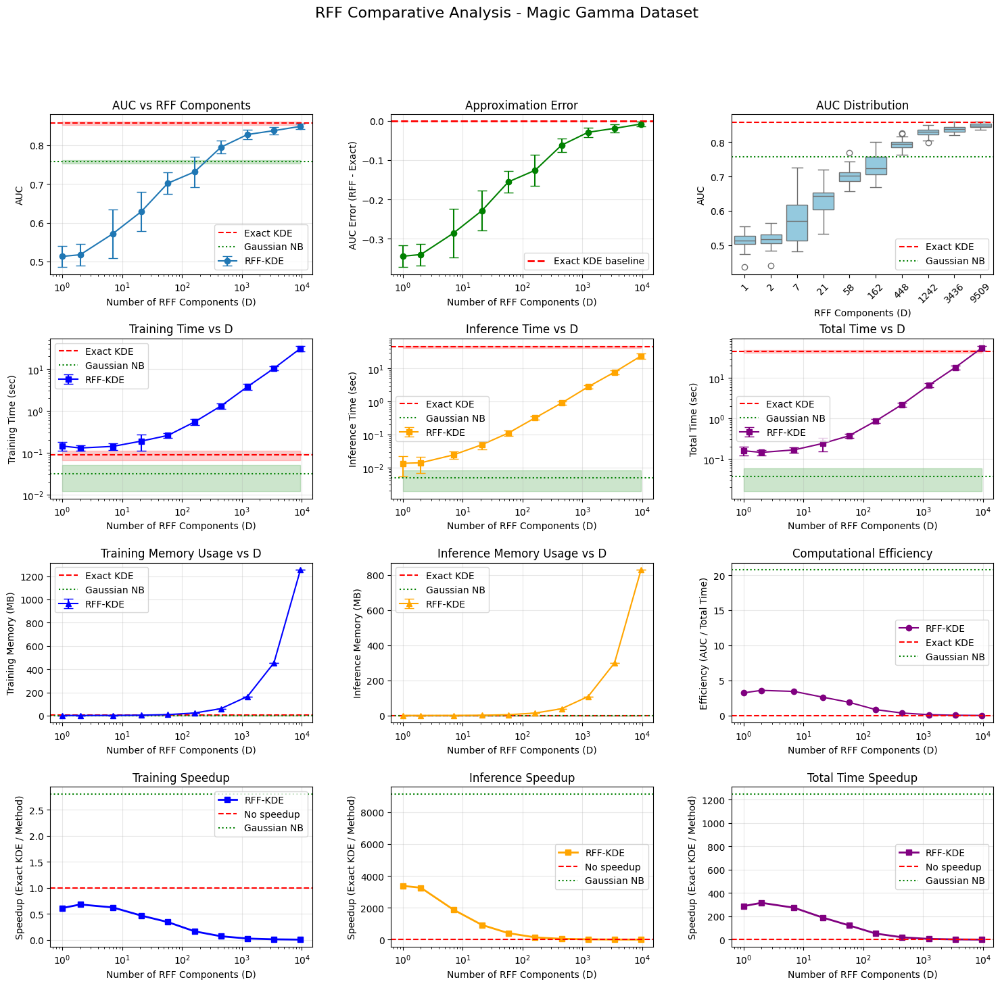

In [8]:
print("="*80)
print("VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS ON MAGIC GAMMA DATASET")
print("="*80)

df_magic = pd.DataFrame(results_magic)
plot_rff_comparative_analysis_magic(df_magic, D_VALUES_REAL)

## Complexity check for the RFF

In [9]:
print("="*80)
print("STARTING THE SCALING TESTS")
print("="*80)
print(f"Scaling Analysis: Testing {len(sizes)} dataset sizes")
print(f"Different seeds: {len(SEEDS)}")
print(f"Total experiments: {len(sizes) * len(SEEDS)}")
print(f"Parallel workers: {N_JOBS}")
print("="*80)

# Create all combinations of (size, seed)
tasks_scaling = [(size, seed) for size in sizes for seed in SEEDS]

print(f"\nProcessing {len(tasks_scaling)} total tasks in parallel:")

# Execute in parallel
results_scaling_nested = Parallel(n_jobs=N_JOBS, verbose=10)(
    delayed(process_size_run)(size, seed) for size, seed in tasks_scaling
)

# Flatten results
results_scaling = [item for sublist in results_scaling_nested for item in sublist]

print("\n\nScaling benchmark complete")

STARTING THE SCALING TESTS
Scaling Analysis: Testing 5 dataset sizes
Different seeds: 20
Total experiments: 100
Parallel workers: 7

Processing 100 total tasks in parallel:


[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
python(62349) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62350) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62351) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62352) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62353) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62354) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(62355) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
[Parallel(n_jobs=7)]: Done   4 tasks      | elapsed:    6.1s
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:    7.4s
[Parallel(n_jobs=7)]: Done  18 tasks      | elapsed:    7.7s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    



Scaling benchmark complete


VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE DATASET SIZES FOR THE SCALING TEST
Saved plot to img/rff_comparative_analysis_scaling.png


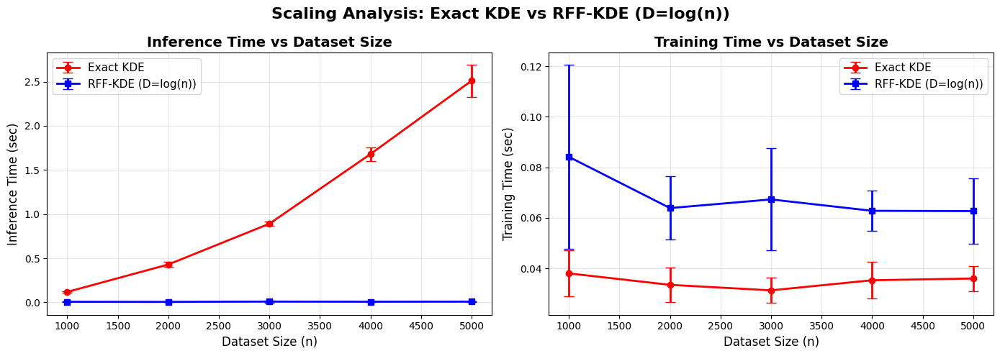

In [10]:
print("="*80)
print("VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE DATASET SIZES FOR THE SCALING TEST")
print("="*80)
plot_rff_comparative_analysis_scaling(results_scaling)

In [11]:
print("\n" + "="*80)
print("SCALING SUMMARY: Exact KDE vs RFF-KDE")
print("="*80)
scaling_summary_table(results_scaling, sizes)


SCALING SUMMARY: Exact KDE vs RFF-KDE
 Size  D  KDE_Train_Time  RFF_Train_Time  KDE_Infer_Time  RFF_Infer_Time  Train_Speedup  Infer_Speedup  KDE_AUC  RFF_AUC  AUC_Diff
 1000  6          0.0380          0.0841          0.1178          0.0061         0.4517        19.3375   0.9010   0.6770   -0.2240
 2000  7          0.0335          0.0639          0.4285          0.0053         0.5241        81.0151   0.9129   0.7262   -0.1867
 3000  8          0.0313          0.0673          0.8906          0.0083         0.4651       107.1065   0.8815   0.6712   -0.2104
 4000  8          0.0353          0.0628          1.6801          0.0068         0.5622       245.5087   0.9212   0.6864   -0.2348
 5000  8          0.0360          0.0627          2.5107          0.0076         0.5741       330.3675   0.9277   0.6867   -0.2410

INTERPRETATION
As dataset size increases from 1000 to 5000:
- RFF-KDE uses D=log(n) features, ranging from 6 to 8
- Training speedup ranges from 0.45x to 0.57x
- Inference sp

## Statistical tests
At what minimum D does RFF-KDE not significantly differ from Exact KDE?

In [15]:
print("="*80)
print("STATISTICAL EQUIVALENCE TESTING FOR RFF-KDE RESULTS")
print("="*80)

df_results = pd.DataFrame(results)
stratified_results_2 = equivalence_test_rff_kde(df_results, D_VALUES, equivalence_margin=0.02)
stratified_results_5 = equivalence_test_rff_kde(df_results, D_VALUES, equivalence_margin=0.05)
stratified_results_10 = equivalence_test_rff_kde(df_results, D_VALUES, equivalence_margin=0.1)

STATISTICAL EQUIVALENCE TESTING FOR RFF-KDE RESULTS

 TOST EQUIVALENCE TESTING: RFF vs EXACT KDE
Equivalence margin: Â±0.0200 AUC
Significance level: Î± = 0.05
Method selection: auto
Multiple testing correction: Holm-Bonferroni
Number of D values: 10
Bootstrap samples: 10000

DIFFICULTY: EASY
Sample size: 200 seeds per D value

  âš  D=1: Non-normal differences (Shapiro p=0.0000)
  âš  D=2: Non-normal differences (Shapiro p=0.0000)
  âš  D=5: Non-normal differences (Shapiro p=0.0000)
  âš  D=11: Non-normal differences (Shapiro p=0.0000)
  âš  D=25: Non-normal differences (Shapiro p=0.0000)
  âš  D=58: Non-normal differences (Shapiro p=0.0000)
  âš  D=131: Non-normal differences (Shapiro p=0.0000)
  âš  D=295: Non-normal differences (Shapiro p=0.0000)
  âš  D=665: Non-normal differences (Shapiro p=0.0000)
  âš  D=1500: Non-normal differences (Shapiro p=0.0000)
D        Mean Î”    SE        p(equiv)    Adj.p       90% CI                   Cohen d   Method      Decision
------------------

Modified TOST

In [16]:
print("="*80)
print("STATISTICAL EQUIVALENCE TESTING FOR RFF-KDE RESULTS WITH DETAILED DIAGNOSTICS")
print("="*80)

df_results = pd.DataFrame(results)

# AUTO MODE (recommended): Chooses parametric or bootstrap based on normality
stratified_results = equivalence_test_rff_kde(
        df_results,
        D_VALUES,
        equivalence_margin=0.05,
        alpha=0.05,
        method='auto',              # Automatic selection
        check_assumptions=True,
        save_diagnostics=False,
        n_bootstrap=10000
)

# Print summary
print_summary_table(stratified_results)

STATISTICAL EQUIVALENCE TESTING FOR RFF-KDE RESULTS WITH DETAILED DIAGNOSTICS

 TOST EQUIVALENCE TESTING: RFF vs EXACT KDE
Equivalence margin: Â±0.0500 AUC
Significance level: Î± = 0.05
Method selection: auto
Multiple testing correction: Holm-Bonferroni
Number of D values: 10
Bootstrap samples: 10000

DIFFICULTY: EASY
Sample size: 200 seeds per D value

  âš  D=1: Non-normal differences (Shapiro p=0.0000)
  âš  D=2: Non-normal differences (Shapiro p=0.0000)
  âš  D=5: Non-normal differences (Shapiro p=0.0000)
  âš  D=11: Non-normal differences (Shapiro p=0.0000)
  âš  D=25: Non-normal differences (Shapiro p=0.0000)
  âš  D=58: Non-normal differences (Shapiro p=0.0000)
  âš  D=131: Non-normal differences (Shapiro p=0.0000)
  âš  D=295: Non-normal differences (Shapiro p=0.0000)
  âš  D=665: Non-normal differences (Shapiro p=0.0000)
  âš  D=1500: Non-normal differences (Shapiro p=0.0000)
D        Mean Î”    SE        p(equiv)    Adj.p       90% CI                   Cohen d   Method      D